In [1]:
import torch
# Feature Extractor using DINOv2
class DINOFeatureExtractor(torch.nn.Module):
    def __init__(self, backbone):
        super().__init__()
        self.backbone = backbone

    def forward(self, x):
        return self.backbone(x)

# Model for Visual Disambiguation
class VisualDisambiguationModel(torch.nn.Module):
    def __init__(self, feature_dim):
        super().__init__()
        self.classifier = torch.nn.Sequential(
            torch.nn.Linear(feature_dim * 2, 512),
            torch.nn.ReLU(),
            torch.nn.Dropout(0.5),
            torch.nn.Linear(512, 1),
            torch.nn.Sigmoid(),
        )

    def forward(self, features1, features2):
        combined_features = torch.cat([features1, features2], dim=1)
        return self.classifier(combined_features)


In [3]:
# Load model and feature extractor
model_load_path = "Arc_de_T_model.pth"

# Reinitialize the feature extractor and model
backbone = torch.hub.load('facebookresearch/dinov2', 'dinov2_vitb14').to('cuda')
feature_extractor = DINOFeatureExtractor(backbone).to('cuda')
model = VisualDisambiguationModel(feature_dim=768).to('cuda')

# Load the saved state_dicts
checkpoint = torch.load(model_load_path)
model.load_state_dict(checkpoint['model_state_dict'])
feature_extractor.load_state_dict(checkpoint['feature_extractor_state_dict'])

print("Model and feature extractor loaded successfully")


Using cache found in C:\Users\user/.cache\torch\hub\facebookresearch_dinov2_main


Model and feature extractor loaded successfully


In [5]:
from PIL import Image
import torchvision.transforms as T

def infer(img1_path, img2_path, feature_extractor, model, device):

    # Preprocessing pipeline
    transform = T.Compose([
        T.Resize((224, 224)),
        T.ToTensor(),
        T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

    # Load and preprocess images
    img1 = transform(Image.open(img1_path).convert("RGB")).unsqueeze(0).to(device)
    img2 = transform(Image.open(img2_path).convert("RGB")).unsqueeze(0).to(device)

    # Extract features
    feature_extractor.eval()
    with torch.no_grad():
        features1 = feature_extractor(img1)
        features2 = feature_extractor(img2)

    # Predict
    model.eval()
    with torch.no_grad():
        output = model(features1, features2).item()  # Sigmoid output

    return output  # Probability of being a match (close to 1 for True)


# Getting random images

In [4]:
import os
import random

def get_two_random_images_with_labels(folder_path):
    """
    Randomly selects two images and their corresponding directions from the folder structure.

    Args:
        folder_path (str): Path to the main folder containing subfolders of directions.

    Returns:
        tuple: Two randomly selected image paths and their respective directions.
    """
    # Step 1: Collect all image paths with their directions
    all_images = []
    for direction in os.listdir(folder_path):
        direction_path = os.path.join(folder_path, direction)
        if os.path.isdir(direction_path):
            images = [
                (os.path.join(direction_path, img), direction)
                for img in os.listdir(direction_path)
                if img.lower().endswith(".jpg")
            ]
            all_images.extend(images)

    # Step 2: Randomly select two images
    if len(all_images) < 2:
        raise ValueError("Not enough images in the folder structure to select two.")
    
    (img1, dir1), (img2, dir2) = random.sample(all_images, 2)  # Ensures two distinct images are chosen
    return img1, dir1, img2, dir2


# Testing functions

In [7]:
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd

def evaluate_and_display_n_random_pairs(folder_path, feature_extractor, model, device, n=5):
    """
    Randomly selects n pairs of images, evaluates them using the model,
    displays the images with their directions, ground truth labels, and match probabilities.

    Args:
        folder_path (str): Path to the main folder containing subfolders of directions.
        feature_extractor (torch.nn.Module): Pretrained feature extractor.
        model (torch.nn.Module): Trained visual disambiguation model.
        device (torch.device): Device to perform computations ('cuda' or 'cpu').
        n (int): Number of random image pairs to evaluate.

    Returns:
        None
    """
    results = []
    for i in range(n):
        try:
            # Select two random images and their labels
            img1, dir1, img2, dir2 = get_two_random_images_with_labels(folder_path)
            
            # Determine the ground-truth label
            label = dir1 == dir2  # True if the directions are the same, False otherwise
            label_text = "True (Same Direction)" if label else "False (Different Directions)"

            # Perform inference with the selected images
            probability = infer(img1, img2, feature_extractor, model, device)
            
            # Display images and details
            fig, axes = plt.subplots(1, 2, figsize=(10, 5))
            for ax, img_path, direction, title in zip(
                axes, [img1, img2], [dir1, dir2], ["Image 1", "Image 2"]
            ):
                img = Image.open(img_path)
                ax.imshow(img)
                ax.axis("off")
                ax.set_title(f"{title}\nDirection: {direction}")

            plt.suptitle(
                f"Ground Truth: {label_text}\nModel Probability: {probability:.4f}",
                fontsize=12,
                color="blue" if label else "red",
            )
            plt.tight_layout(rect=[0, 0, 1, 0.9])
            plt.show()

            # Save results for further analysis
            results.append({
                "Image1": img1,
                "Image2": img2,
                "Direction1": dir1,
                "Direction2": dir2,
                "GroundTruth": label,
                "ModelProbability": probability,
            })

        except ValueError as e:
            print(f"Error selecting images for pair {i + 1}: {str(e)}")

    # Return the results as a DataFrame
    return pd.DataFrame(results)


In [11]:
import matplotlib.pyplot as plt
from PIL import Image

def evaluate_and_print_specific_images(img1_path, img2_path, feature_extractor, model, device):
    """
    Evaluate a specific pair of images, display them side by side, and print their details.

    Args:
        img1_path (str): Path to the first image.
        img2_path (str): Path to the second image.
        feature_extractor (torch.nn.Module): Pretrained feature extractor.
        model (torch.nn.Module): Trained visual disambiguation model.
        device (torch.device): Device to perform computations ('cuda' or 'cpu').

    Returns:
        dict: Dictionary containing evaluation details (image paths, probability, etc.).
    """
    try:
        # Perform inference with the specified images
        probability = infer(img1_path, img2_path, feature_extractor, model, device)

        # Display the images side by side
        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        for ax, img_path, title in zip(
            axes, [img1_path, img2_path], ["Image 1", "Image 2"]
        ):
            img = Image.open(img_path)
            ax.imshow(img)
            ax.axis("off")
            ax.set_title(title)

        plt.suptitle(
            f"Model Probability: {probability:.4f}",
            fontsize=14,
            color="blue" if probability > 0.5 else "red",
        )
        plt.tight_layout(rect=[0, 0, 1, 0.9])
        plt.show()

        # Print the image details
        print("Evaluation Details:")
        print(f"Image 1: {img1_path}")
        print(f"Image 2: {img2_path}")
        print(f"Model's Match Probability: {probability:.4f}")

        # Return the results for reference
        return {
            "Image1": img1_path,
            "Image2": img2_path,
            "ModelProbability": probability,
        }

    except Exception as e:
        print(f"Error evaluating the images: {e}")
        return None


# Now testing

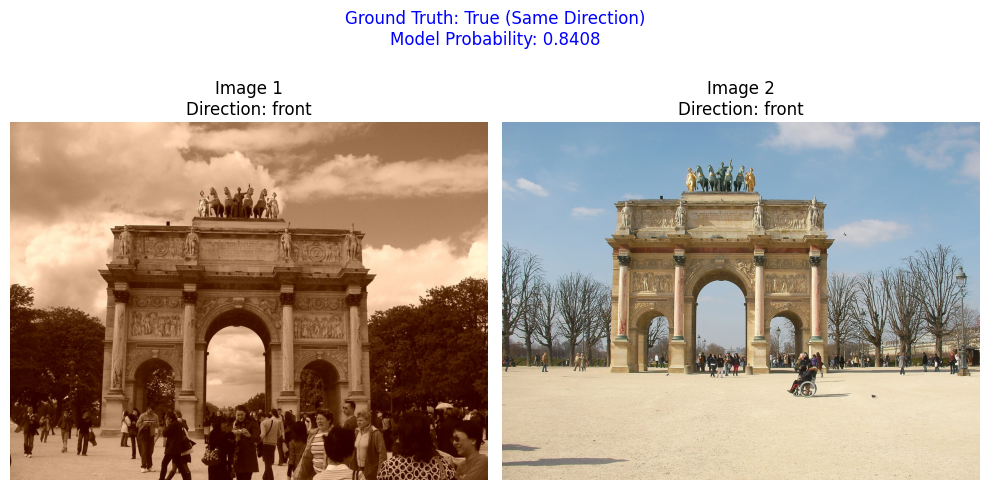

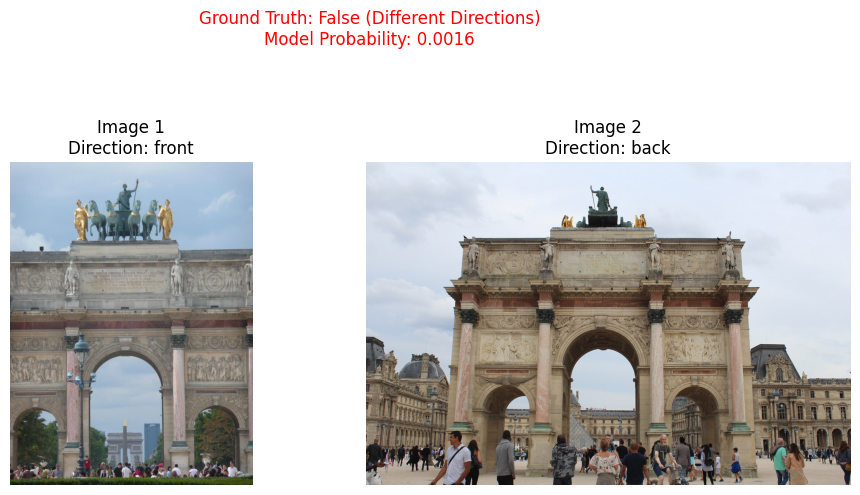

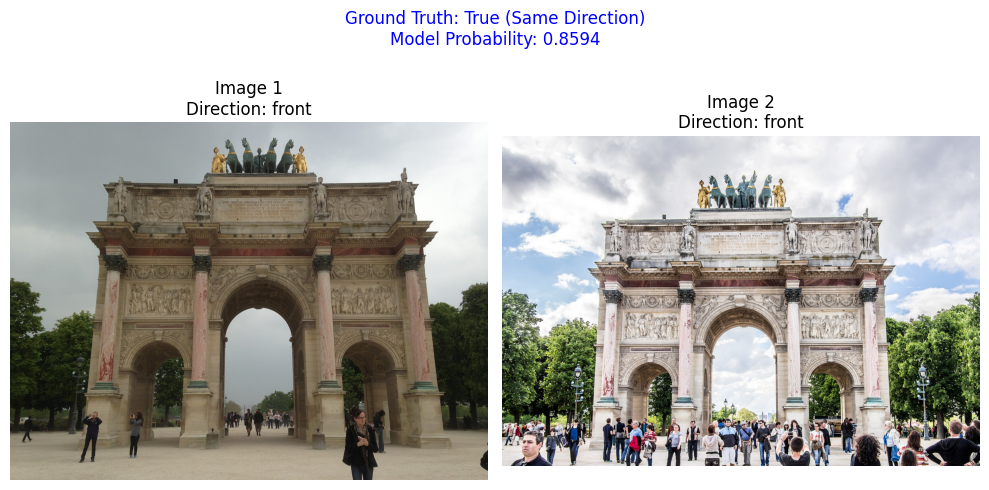

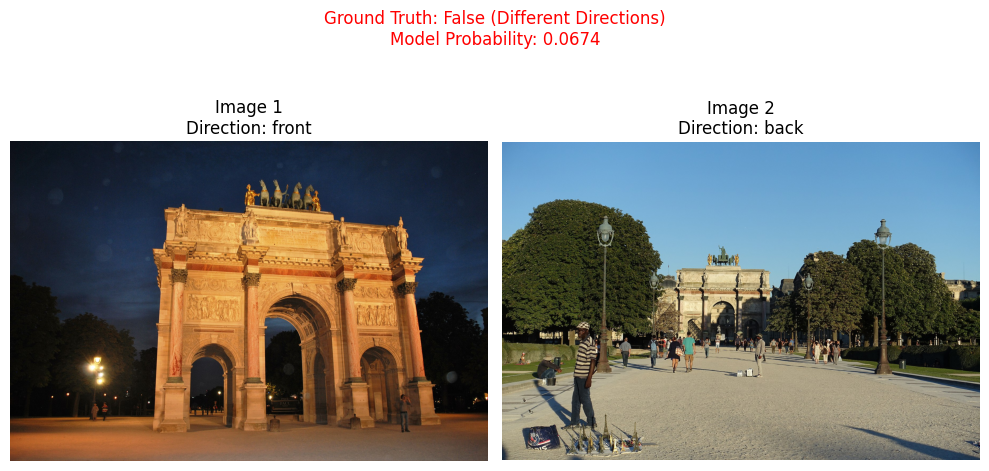

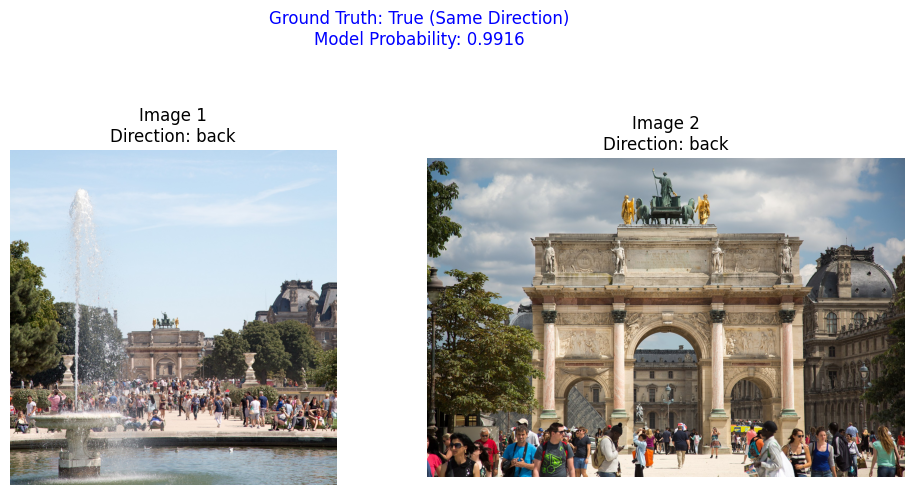

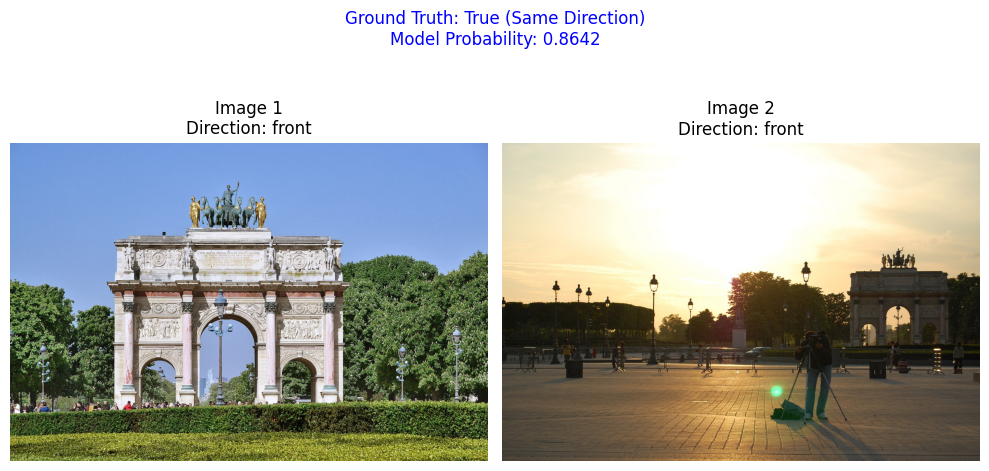

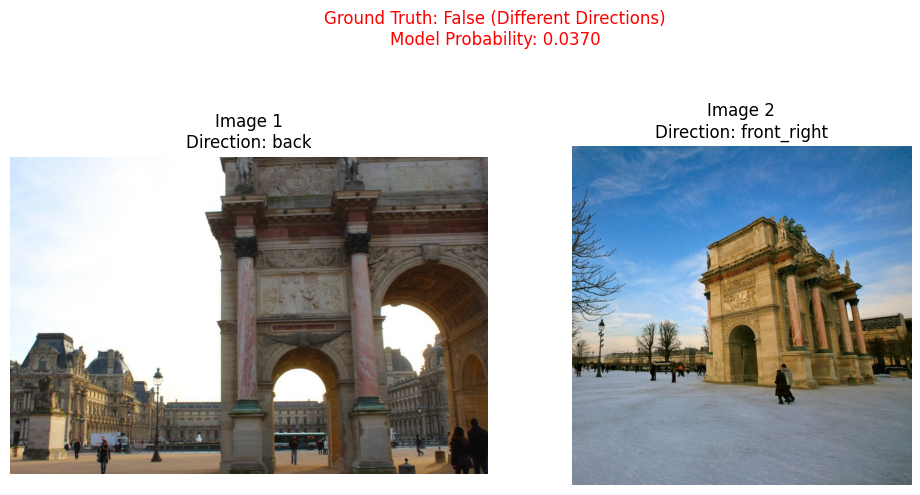

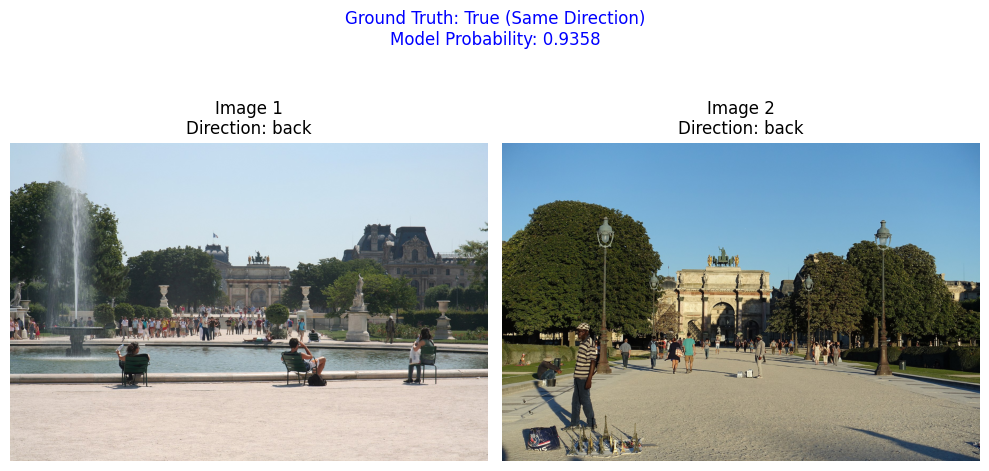

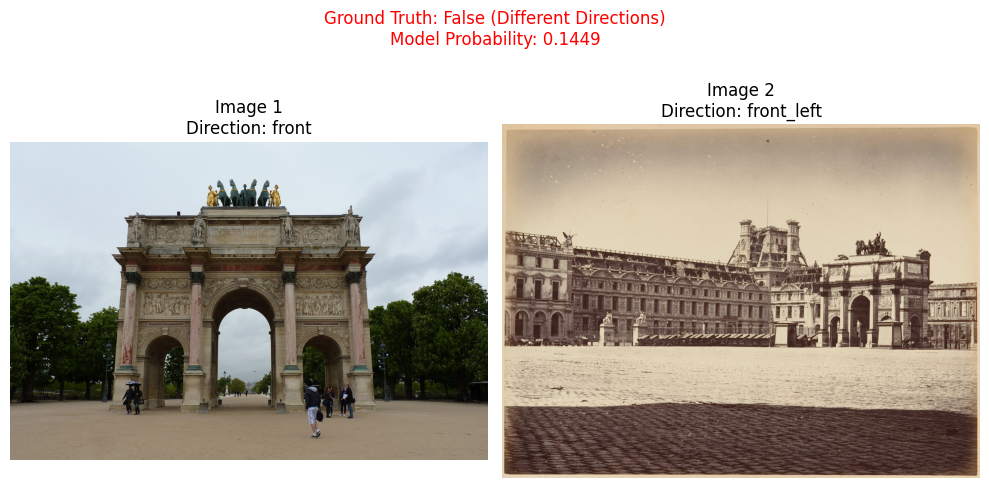

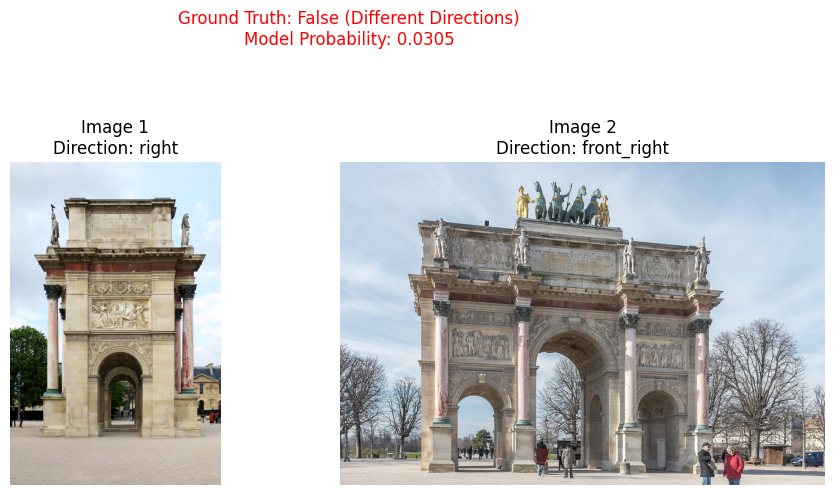

In [10]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

results_df = evaluate_and_display_n_random_pairs("Arc_de_T", feature_extractor, model, device, n=10)


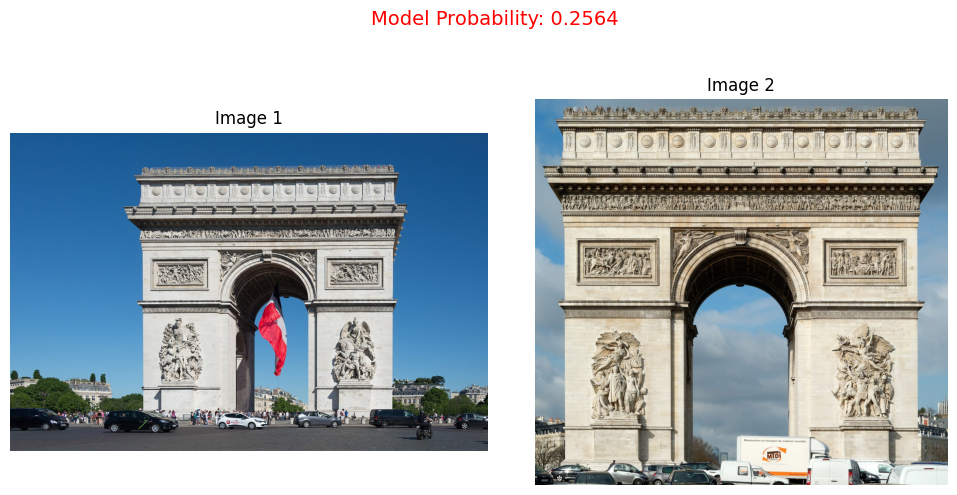

Evaluation Details:
Image 1: Handpick/back.jpg
Image 2: Handpick/front.jpg
Model's Match Probability: 0.2564
Evaluation Details:
{'Image1': 'Handpick/back.jpg', 'Image2': 'Handpick/front.jpg', 'ModelProbability': 0.2563873529434204}


In [13]:
# Specify paths to the two images you want to evaluate
img1_path = "Handpick/back.jpg"
img2_path = "Handpick/front.jpg"

# Evaluate the specified images
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
result = evaluate_and_print_specific_images(img1_path, img2_path, feature_extractor, model, device)

# Print the evaluation details
if result:
    print(f"Evaluation Details:\n{result}")


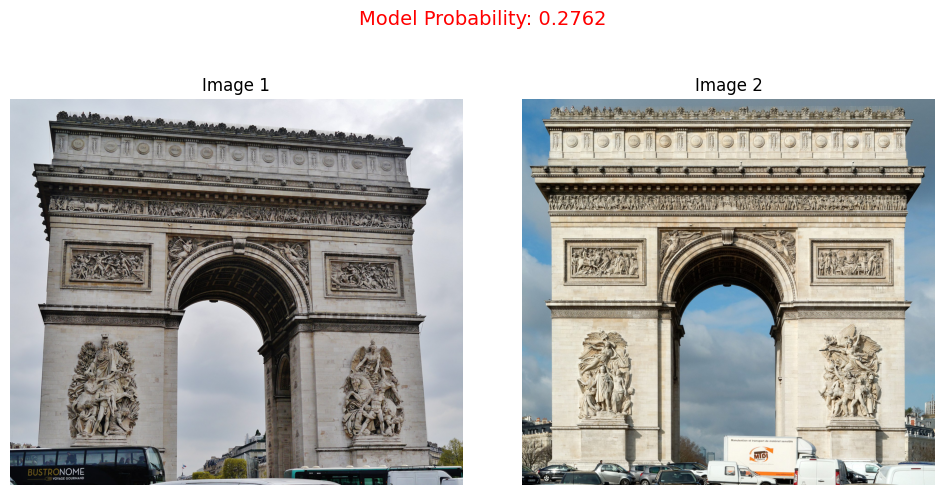

Evaluation Details:
Image 1: Handpick/back2.jpg
Image 2: Handpick/front.jpg
Model's Match Probability: 0.2762


{'Image1': 'Handpick/back2.jpg',
 'Image2': 'Handpick/front.jpg',
 'ModelProbability': 0.2761683464050293}

In [15]:
evaluate_and_print_specific_images("Handpick/back2.jpg", "Handpick/front.jpg", feature_extractor, model, device)

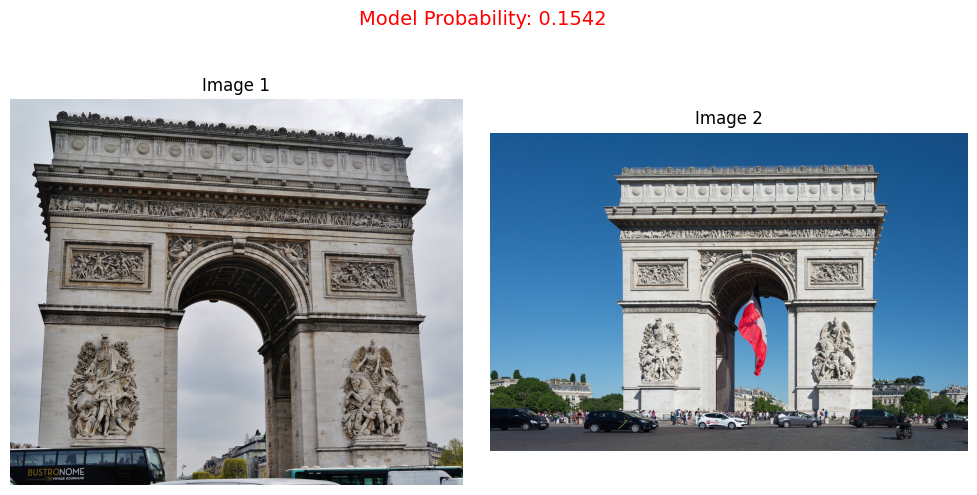

Evaluation Details:
Image 1: Handpick/back2.jpg
Image 2: Handpick/back.jpg
Model's Match Probability: 0.1542


{'Image1': 'Handpick/back2.jpg',
 'Image2': 'Handpick/back.jpg',
 'ModelProbability': 0.15422698855400085}

In [16]:
evaluate_and_print_specific_images("Handpick/back2.jpg", "Handpick/back.jpg", feature_extractor, model, device)

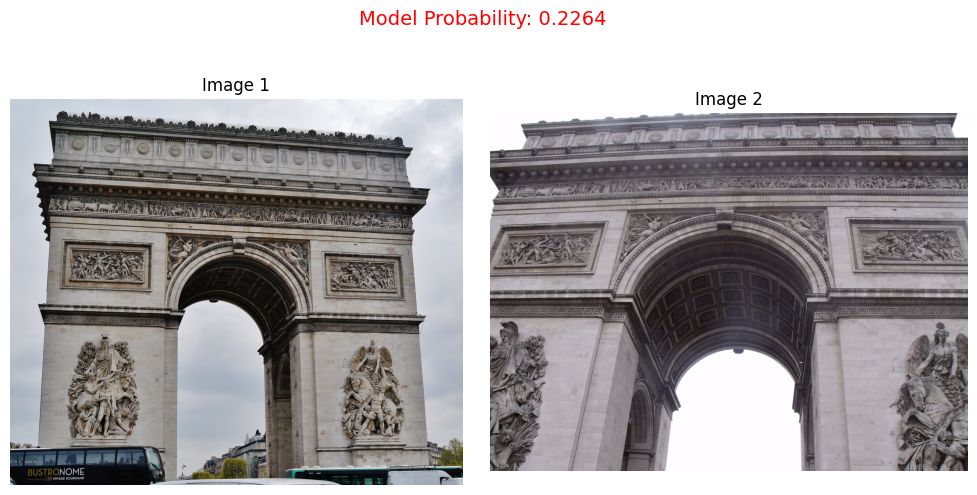

Evaluation Details:
Image 1: Handpick/back2.jpg
Image 2: Handpick/back3.jpg
Model's Match Probability: 0.2264


{'Image1': 'Handpick/back2.jpg',
 'Image2': 'Handpick/back3.jpg',
 'ModelProbability': 0.226362407207489}

In [17]:
evaluate_and_print_specific_images("Handpick/back2.jpg", "Handpick/back3.jpg", feature_extractor, model, device)